# Investigation of z value behaviour for differing m values

In [1]:
%config IPCompleter.greedy=True

In [5]:
import igraph
import numpy as np
import matplotlib.pyplot as plt

In [6]:
%matplotlib inline
# %matplotlib qt5

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Times New Roman"]})



In [63]:
N = 3_000
m_list = range(1,30)
p_list = range(1,30)
# g_list = list(map(lambda m: igraph.Graph.Barabasi(N, m), m_list))
g_list = list(map(lambda p: max(igraph.Graph.Erdos_Renyi(N, 2*p/N).decompose(), key=igraph.Graph.vcount), p_list))
# max(g.decompose(), key=igraph.Graph.vcount)

In [71]:
d_array = np.array(list(map(lambda g: g.degree(), g_list)))
c_array = np.array(list(map(lambda g: g.closeness(), g_list)))

#error cheking:
if len(d_array[0]) != len(c_array[0]): raise Exception("Icompatible sizes")

In [64]:
# d_array_processed = np.log(d_array)
# c_array_processed = 1.0 / c_array
d_array_processed = np.array(list(map(lambda g: np.log(np.array(g.degree())), g_list)))
c_array_processed = np.array(list(map(lambda g: 1/np.array(g.closeness()), g_list)))


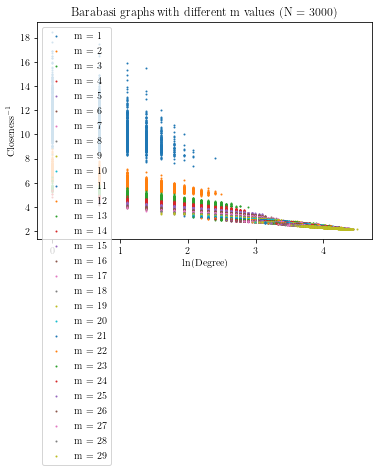

In [65]:
for i, m in enumerate(p_list):
    plt.scatter(d_array_processed[i], c_array_processed[i], label=f'm = {m}', s=1)

plt.title(f'Barabasi graphs with different m values (N = {N})')
plt.xlabel('ln(Degree)')
plt.ylabel('Closeness$^{-1}$')
plt.legend()
plt.show()


In [66]:
# b[0] * x ** 0 + b[1] * x ** 1 + b[2] * x ** 2 + ...
def polynomial (beta, x):
    return sum([b * x ** i for i,b in enumerate(beta)])



In [67]:
from scipy.odr import ODR, Model, Data, RealData

In [68]:
odr_outs = []


for d, c in zip(d_array_processed, c_array_processed):
    model = Model(polynomial)
    data = Data(d, c)
    # data = RealData(x_data, y_data, x_error, y_error)

    # length of beta0 gives polynomial
    odr = ODR(data, model, [0,0])
    odr.set_job(fit_type=2)
    output = odr.run()
    
    odr_outs.append(output)

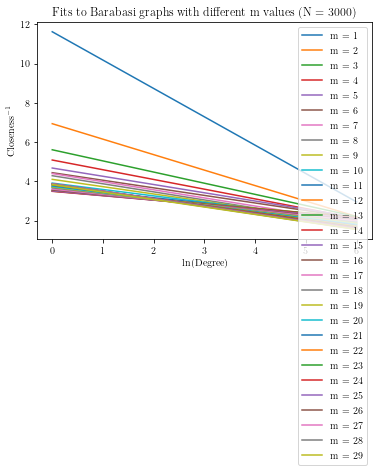

In [69]:
x = np.linspace(0,6, 10)
for i, m in enumerate(p_list):
    plt.plot(x, polynomial(odr_outs[i].beta, x), label=f'm = {m}')

plt.title(f'Fits to Barabasi graphs with different m values (N = {N})')
plt.xlabel('ln(Degree)')
plt.ylabel('Closeness$^{-1}$')
plt.legend()
plt.show()


In [73]:
print(f"N = {N}")

z_list = []

for i, m in enumerate(p_list):
    gradient = odr_outs[i].beta[1]
    z = np.exp(-1 / gradient)
    z_sd = np.sqrt((((1 / gradient) * z) * odr_outs[i].sd_beta[1]) ** 2)
    z_exp = np.average(np.array(d_array[i]) ** 2)/np.average(d_array[i]) - 1
    z_list.append((z,z_exp)) # also need errors 
    print(f"\nm = {m}")
    # print(f"Gradiend: \t\t{gradient} ± {odr_outs[i].sd_beta[1]}")
    # # print(f"Correction term: \t{odr_outs[i].beta[2]} ± {odr_outs[i].sd_beta[2]}")
    # print(f"Expected z value: \t{z_exp}")
    # print(f"Measured z value: \t{z} ± {z_sd}")
    print(f"Fraction: \t{z/z_exp} ± {z_sd/z_exp}")

N = 3000

m = 1
Fraction: 	0.9506899474344253 ± 0.030656285816927007

m = 2
Fraction: 	0.9004746024570831 ± 0.010204033900739332

m = 3
Fraction: 	0.9551861752957918 ± 0.007746283268182216

m = 4
Fraction: 	0.9535739832594741 ± 0.006118857983977295

m = 5
Fraction: 	1.096268161014305 ± 0.0065845883600013635

m = 6
Fraction: 	1.113449479562243 ± 0.005848482897826471

m = 7
Fraction: 	0.8014079819154222 ± 0.003906676366088408

m = 8
Fraction: 	0.7041718091202531 ± 0.003271805444411983

m = 9
Fraction: 	0.8082200133093032 ± 0.0037574534401891226

m = 10
Fraction: 	1.0919839054510763 ± 0.004693971475885921

m = 11
Fraction: 	1.7976482659524626 ± 0.007688038141128034

m = 12
Fraction: 	3.2831915821931497 ± 0.012325020572950963

m = 13
Fraction: 	3.5164289885362896 ± 0.012776778608149688

m = 14
Fraction: 	3.0788236578066748 ± 0.011049779495841839

m = 15
Fraction: 	2.2909669630908125 ± 0.0082163709387912

m = 16
Fraction: 	1.6771269387450805 ± 0.006000636173099084

m = 17
Fraction: 	1.19236

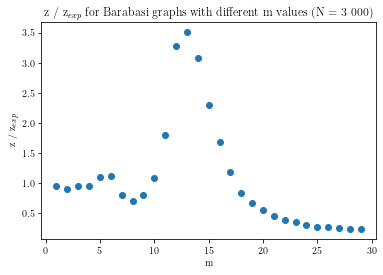

In [74]:
for i, z in enumerate(z_list):
    plt.scatter(p_list[i], z[0]/z[1], label=f'm = {p_list[i]}', c='tab:blue')

plt.title('z / z$_{exp}$ for Barabasi graphs with different p values (N = 3 000)')
plt.xlabel('p')
plt.ylabel('z / z$_{exp}$')
# plt.legend()
plt.show()

Model the decaying side and come up with a way of correcting the z value?